In [1]:
from re import U
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.patches as mpatches
from icecream import ic # for printing/debugging
import pandas as pd

import patchify as pat
from pathlib import Path

# import custom modules
import NavigatingTheMatrix as nvm
import As_detection as asd

# importlib allows to reload the module if changes have been made to it without having to restart the whole kernel
import importlib

c:\Users\nkolev\OneDrive - University College London\Documents\GitHub\NavigatingTheMatrix\As_detection.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_

In [4]:
# load desired matrix file and make an STM object from NavigatingTheMatrix file
cwd = Path.cwd() # current working directory

path = cwd / 'Earls court examples' / '20181123-122007_STM_AtomManipulation-Earls Court-Si(100)-H term--14_1.Z_mtrx'

scan_dict = {'file': str(path), 
                'standard_pix_ratio': 1024/200
                }

scan = nvm.STM( scan_dict )
    

Pixel to nm ratio is twice as large as desired in trace up fwd . Pixels will be halved so that feature detection can be carried out on surface.
Pixel to nm ratio is twice as large as desired in retrace up . Pixels will be halved so that feature detection can be carried out on surface.
Pixel to nm ratio is twice as large as desired in trace down . Pixels will be halved so that feature detection can be carried out on surface.
Pixel to nm ratio is twice as large as desired in retrace down . Pixels will be halved so that feature detection can be carried out on surface.


In [5]:
# clean up the scans

scan.clean_up(scan.trace_up, 'trace up', plane_level=True)
scan.clean_up(scan.retrace_up, 'retrace up', plane_level=True)

scan.clean_up(scan.trace_down, 'trace down', plane_level=True)
scan.clean_up(scan.retrace_down, 'retrace down', plane_level=True)

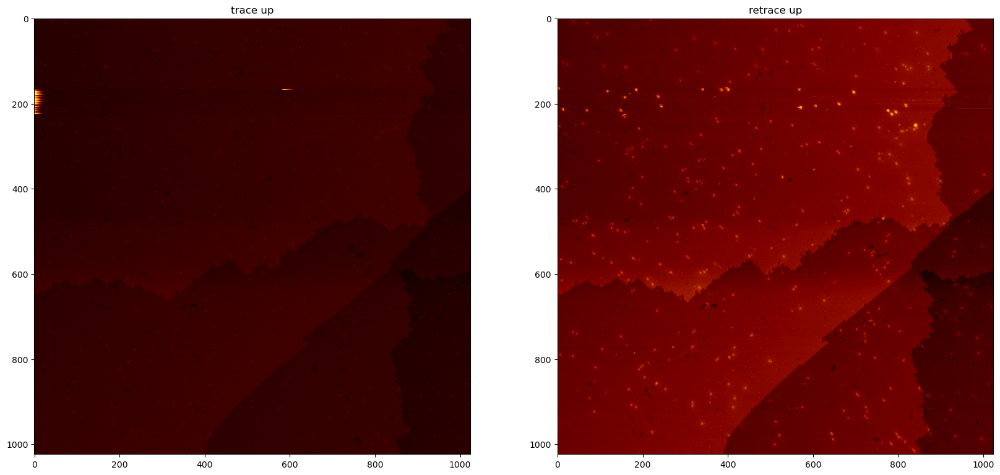

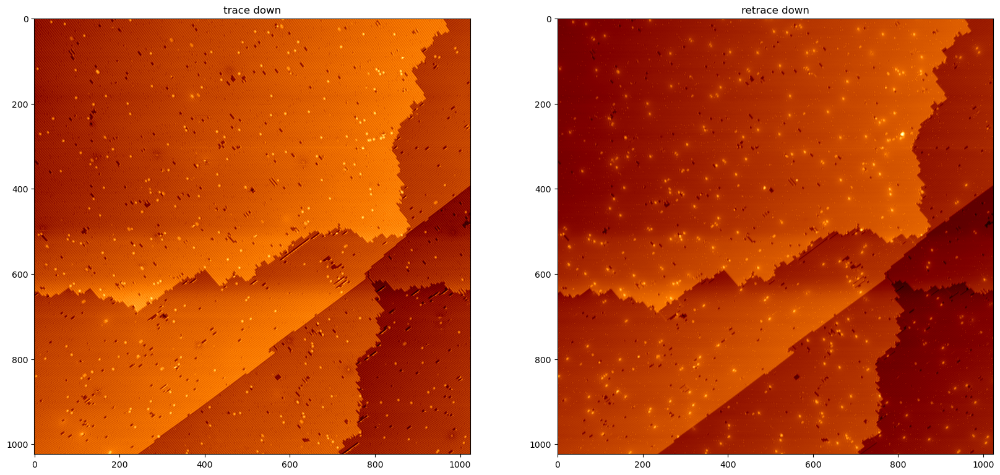

In [6]:
# plot the cleaned up scans and choose whether to use trace up or down
# (Viewing with gwyddion provides better quality images for inspection in my opinion)

fig, ax = plt.subplots(1,2, figsize=(20,15))
ax[0].imshow(scan.trace_up_proc, cmap='afmhot')
ax[0].set_title('trace up')
ax[1].imshow(scan.retrace_up_proc, cmap='afmhot')
ax[1].set_title('retrace up')
plt.show()

fig, ax = plt.subplots(1,2, figsize=(20,15))
ax[0].imshow(scan.trace_down_proc, cmap='afmhot')
ax[0].set_title('trace down')
ax[1].imshow(scan.retrace_down_proc, cmap='afmhot')
ax[1].set_title('retrace down')
plt.show()

In [8]:
# correct hysteresis
scan.trace_up_proc, scan.retrace_up_proc, corrected, k = scan.correct_hysteresis(scan.trace_up_proc, scan.retrace_up_proc, 'trace up')   
scan.trace_down_proc, scan.retrace_down_proc, corrected, k = scan.correct_hysteresis(scan.trace_down_proc, scan.retrace_down_proc, 'trace down')
   

Number of matches found for hysteresis correction: 202 . If it's only a few (less than ~3) the correction will not be very accurate.
Number of matches found for hysteresis correction: 209 . If it's only a few (less than ~3) the correction will not be very accurate.


In [155]:
importlib.reload(asd)

c:\Users\nkolev\OneDrive - University College London\Documents\GitHub\NavigatingTheMatrix\As_detection.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_

<module 'As_detection' from 'c:\\Users\\nkolev\\OneDrive - University College London\\Documents\\GitHub\\NavigatingTheMatrix\\As_detection.py'>

In [156]:
# make a Si_scan object just for trace down
trace_up = asd.Si_Scan(scan, 'trace up', As=False) # As = False if not dosed yet
trace_down = asd.Si_Scan(scan, 'trace down', As=False)

Resolution of image is 1024 by 1024
Resolution of image is 1024 by 1024


In [157]:
# make detector object to find and label defects
detector = asd.Detector()

In [158]:
# run prediction
trace_down.one_hot_segmented = detector.predict(trace_down)

Number of features is 478


In [159]:
# turn output into rgb image
trace_down.rgb = detector.turn_rgb(trace_down.one_hot_segmented)

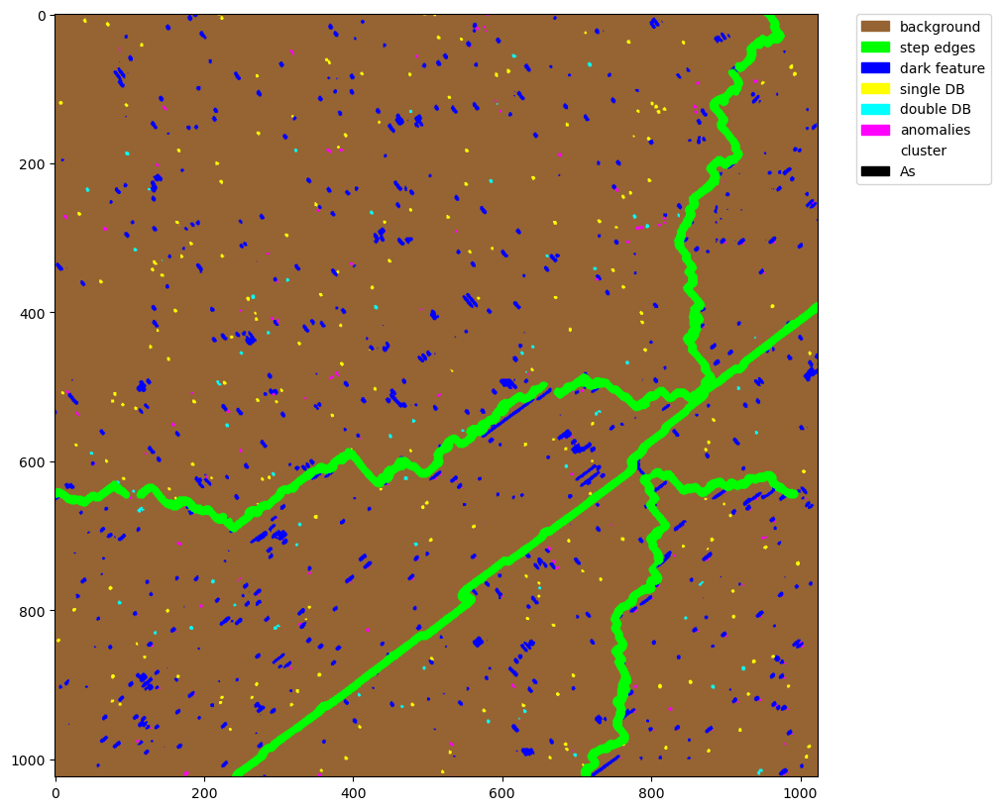

In [160]:
# show image
plt.figure(figsize=(10,10))
plt.imshow(trace_down.rgb)

# Create custom legend handles
legend_handles = []
for rgb, label in detector.legend.items():
    color = np.array(rgb)  # Normalize RGB values to [0, 1] for Matplotlib
    patch = mpatches.Patch(color=color, label=label)
    legend_handles.append(patch)

# Add the custom legend to the plot
plt.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


plt.show()

In [163]:
# find distance between all features then use this to filter for whatever features you want
trace_down.feature_dists()
# all distances are now save in a dictionary which can be accessed by trace_down.features
# keys are the different features in the scan (NOT the feature type). The features are numbered in the order they were found (so keys are 0, 1, 2, 3, etc.)
# values are feature objects (see As_detection.py for more info). Each feature object has things like feature.coord, feature.feature_type
#for key in trace_down.features.keys():
    #print('key:', key)
  #  print('coord: {}, feature type: {}'.format(trace_down.features[key].coord, trace_down.features[key].feature_type))




In [172]:
import gc

In [174]:
gc.collect() # clear memory

0

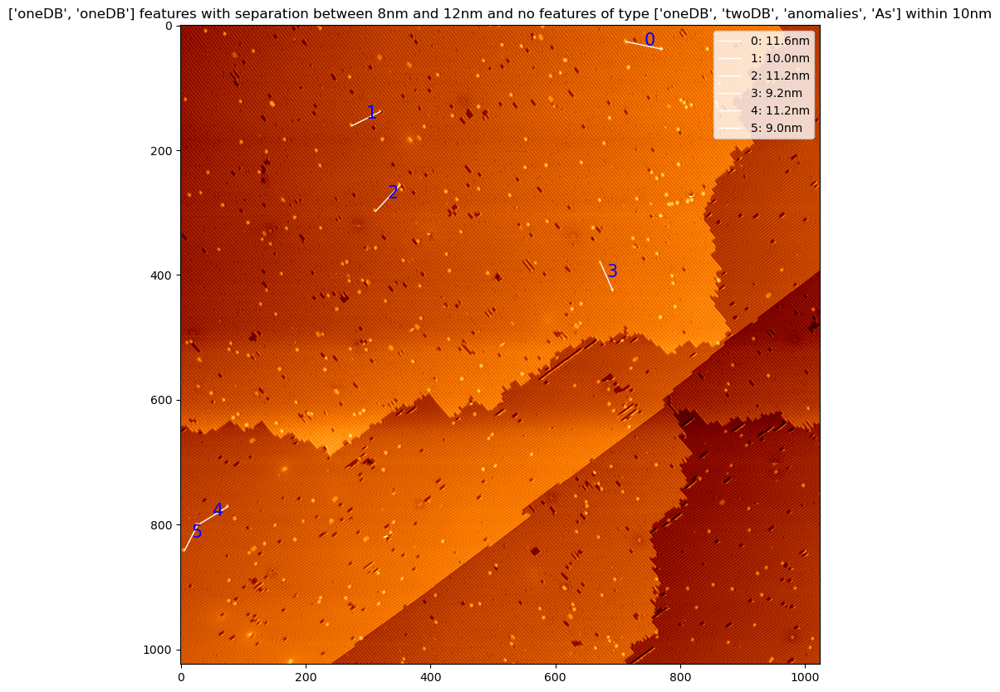

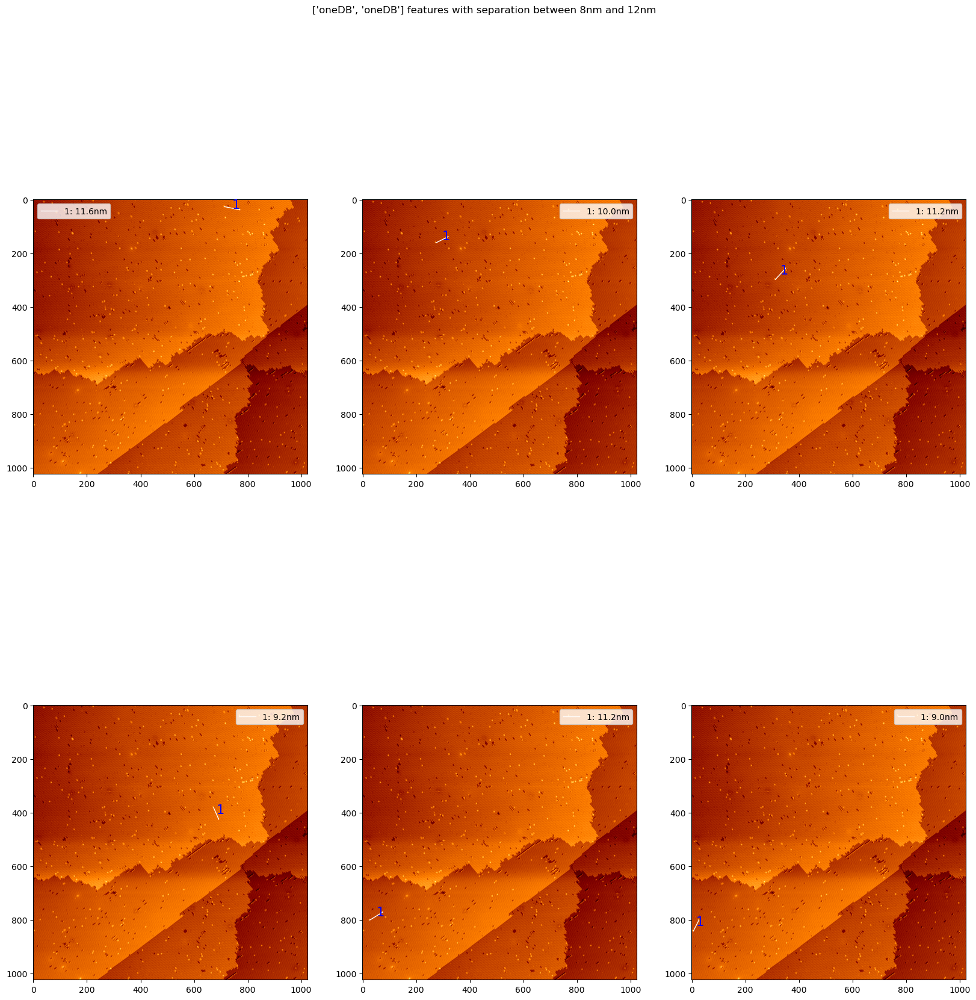

In [170]:
# find all As dopnats that are at a distance of 15nm-20nm from each other
oneDB_to_oneDB = trace_down.find_pairs('oneDB', 'oneDB', max_dist = 12, min_dist = 8, exclusion_dist=10, display_image=True)

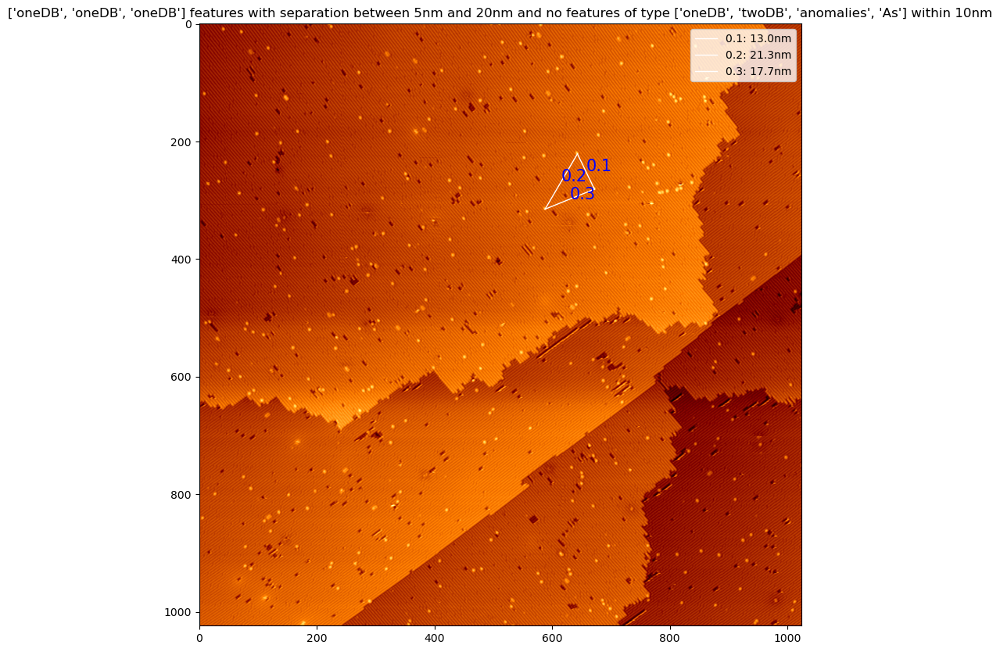

In [167]:
DB_to_DB_to_DB = trace_down.find_triplets('oneDB', 'oneDB', 'oneDB', max_dist = 20, min_dist = 5, max_angle=95, min_angle=85, exclusion_dist=10, display_image=True)

In [522]:
# load desired matrix file and make an STM object from NavigatingTheMatrix file
cwd = Path.cwd() # current working directory

path = cwd / 'Earls court examples' / '20181123-122007_STM_AtomManipulation-Earls Court-Si(100)-H term--20_1.Z_mtrx'

scan = nvm.STM( str(path) , None, None, None, standard_pix_ratio=1024/250)
    

Pixel to nm ratio is 1024pixels for every 200nm in the  trace up fwd
Pixel to nm ratio is 1024pixels for every 200nm in the  retrace up
Pixel to nm ratio is 91pixels for every 200nm in the  trace down
trace down scan was interupted before completion. It will not be used.
Pixel to nm ratio is 91pixels for every 200nm in the  retrace down
retrace down scan was interupted before completion. It will not be used.


In [523]:
# clean up the scans

scan.clean_up(scan.trace_up, 'trace up', plane_level=True)
scan.clean_up(scan.retrace_up, 'retrace up', plane_level=True)

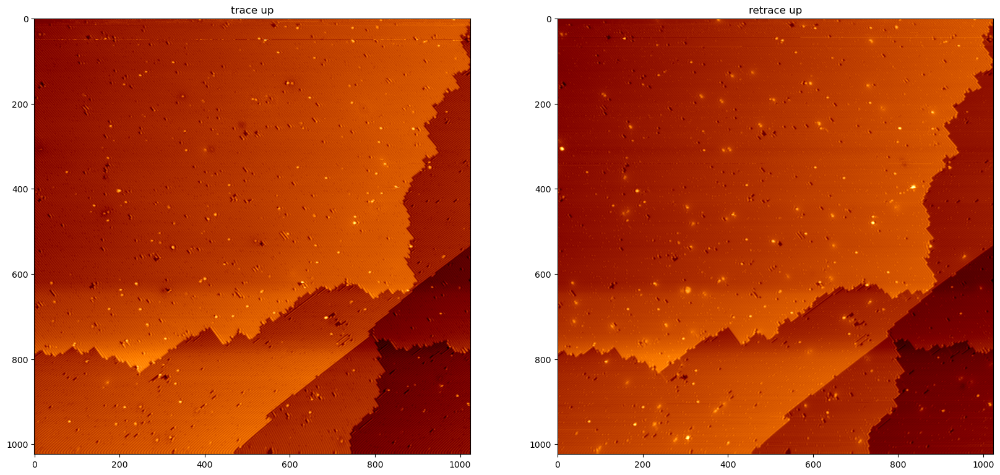

In [524]:
# plot the cleaned up scans and choose whether to use trace up or down
# (Viewing with gwyddion provides better quality images for inspection in my opinion)

fig, ax = plt.subplots(1,2, figsize=(20,15))
ax[0].imshow(scan.trace_up_proc, cmap='afmhot')
ax[0].set_title('trace up')
ax[1].imshow(scan.retrace_up_proc, cmap='afmhot')
ax[1].set_title('retrace up')
plt.show()


In [525]:
# correct hysteresis
scan.trace_up_proc, scan.retrace_up_proc, corrected = scan.correct_hysteresis(scan.trace_up_proc, scan.retrace_up_proc, 'trace up')   
   

Number of matches found for hysteresis correction: 73 . If it's only a few (less than ~3) the correction will not be very accurate.


In [499]:
importlib.reload(asd)

<module 'As_detection' from 'c:\\Users\\nkolev\\OneDrive - University College London\\Documents\\GitHub\\NavigatingTheMatrix\\As_detection.py'>

In [526]:
# make a Si_scan object just for trace down
trace_up = asd.Si_Scan(scan, 'trace up', As = True) # As = False if not dosed yet

Resolution of image is 1024


In [527]:
# make detector object to find and label defects
detector = asd.Detector()

In [528]:
# run prediction
trace_up.one_hot_segmented = detector.predict(trace_up, As = True)


Number of features is 564


In [529]:
# turn output into rgb image
trace_up.rgb = detector.turn_rgb(trace_up.one_hot_segmented)

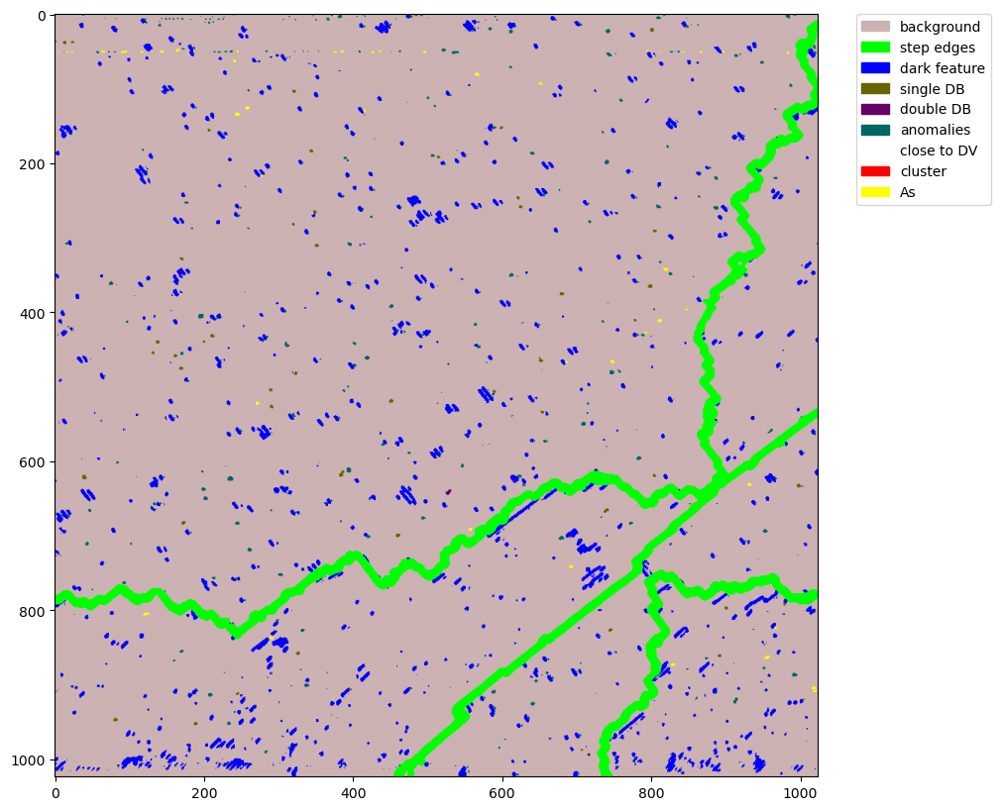

In [530]:
# show image
plt.figure(figsize=(10,10))
plt.imshow(trace_up.rgb)

# Create custom legend handles
legend_handles = []
for rgb, label in detector.legend.items():
    color = np.array(rgb)  # Normalize RGB values to [0, 1] for Matplotlib
    patch = mpatches.Patch(color=color, label=label)
    legend_handles.append(patch)

# Add the custom legend to the plot
plt.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


plt.show()

In [465]:
# find distance between all features then use this to filter for whatever features you want
trace_up.feature_dists()
# all distances are now save in a dictionary which can be accessed by trace_down.features
# keys are the different features in the scan (NOT the feature type). The features are numbered in the order they were found (so keys are 0, 1, 2, 3, etc.)
# values are feature objects (see As_detection.py for more info). Each feature object has things like feature.coord, feature.feature_type


#for key in trace_down.features.keys():
    #print('key:', key)
#    print('coord: {}, feature type: {}'.format(trace_down.features[key].coord, trace_down.features[key].feature_type))



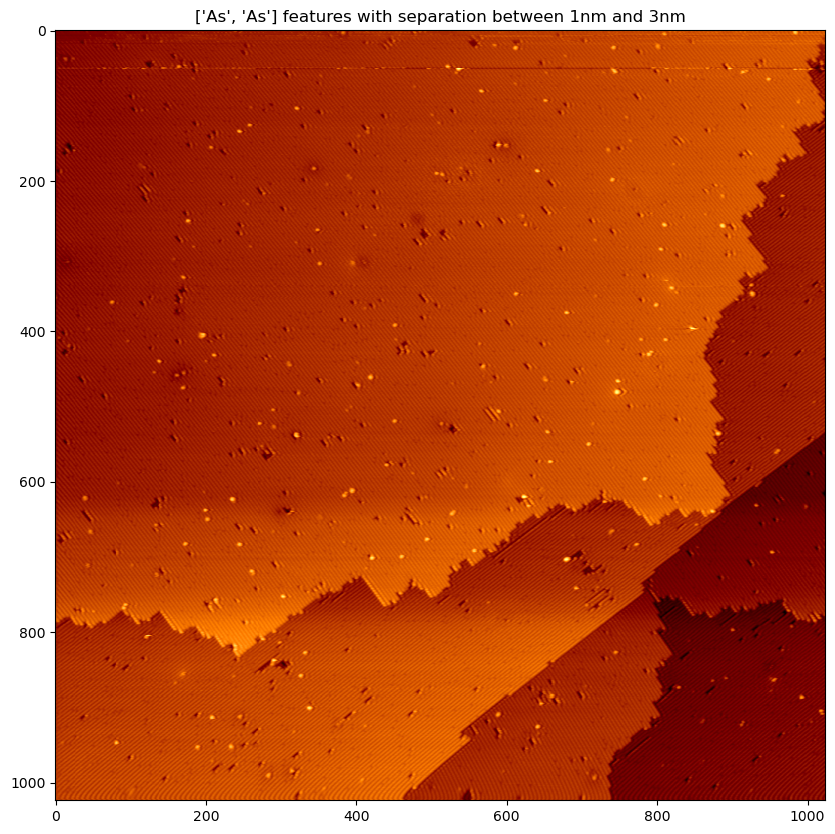

In [532]:
# find all As dopnats that are at a distance of 15nm-20nm from each other
As_to_As = trace_up.find_pairs('As', 'As', max_dist = 3, min_dist = 1, exclusion_dist=3, display_image=True)

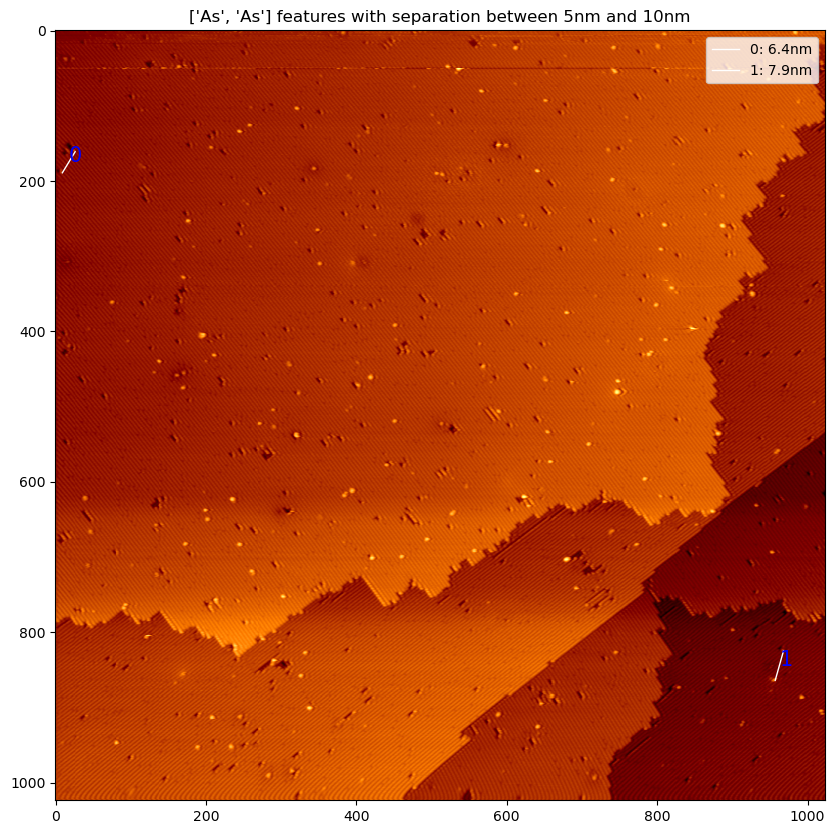

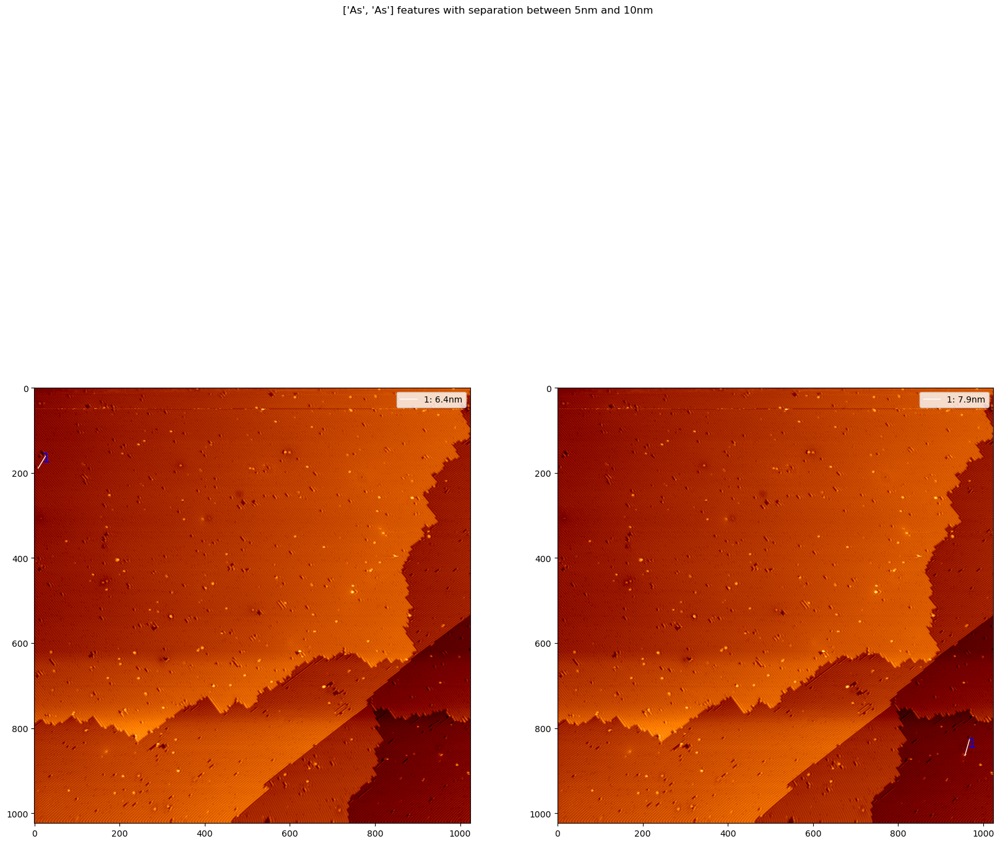

In [428]:
# find all single DBs that are at a distance of 15nm-20nm from each other
As_to_As = trace_up.find_pairs('As', 'As', max_dist = 10, min_dist = 5, exclusion_dist=10, display_image=True)


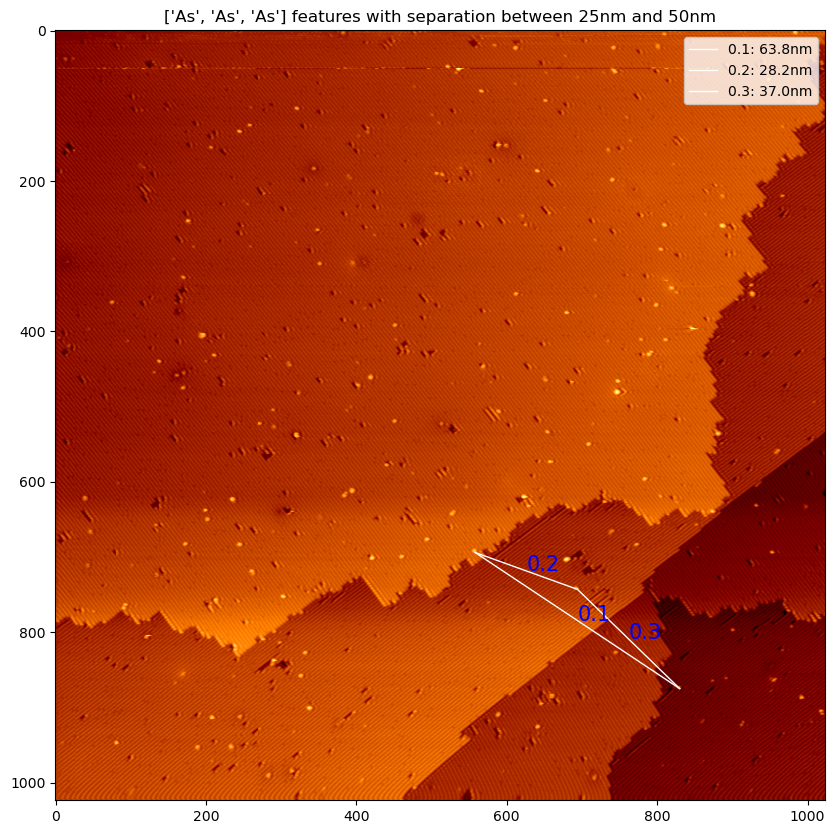

In [439]:
As_to_As_to_As = trace_up.find_triplets('As', 'As', 'As', max_dist = 50, min_dist = 25, max_angle=160, min_angle=60, exclusion_dist=35, display_image=True)

In [5]:
import dask.array as da
import numpy as np

In [11]:
a = np.ones((512,512))

b = da.from_array(a, chunks=(250,250))

print(b[1])

dask.array<getitem, shape=(512,), dtype=float64, chunksize=(250,), chunktype=numpy.ndarray>
